# Chapter 4: Clustering Case Study – Short Tail Keyword Determination

##  Business Problem
Ross, marketing director for an AI conference, needs to identify effective short-tail keywords for SEO campaigns. The dataset includes ~400 accepted research papers from AAAI 2014 with metadata such as `title`, `groups`, `keywords`, and `topics`.

##  Objective
- Segment papers into up to 10 distinct clusters using unsupervised learning.
- Use resulting clusters for SEO keyword targeting and research topic visualization.

##  Dataset Overview
Features selected:
- `title` (Paper title)
- `groups` (High-level category)
- `keywords` (Author-defined tags)
- `topics` (Low-level category)
- `Abstracts` (Paper abstracts)


### Listing 4-1 – Importing Required Packages


In [47]:
# Python 3 compatible imports
%matplotlib inline

import operator
import itertools

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = (15, 5)

# from ggplot import *

from sklearn import mixture
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import euclidean_distances, silhouette_score

from scipy.spatial.distance import cdist, pdist
from wordcloud import WordCloud, STOPWORDS


### Reading the Data in the Memory, and Subsetting Features



In [48]:
data_train = pd.read_csv('datasets/[UCI] AAAI-14 Accepted Papers - Papers.csv')


In [49]:
# Display first few rows
print("🔹 First 5 rows:")
display(data_train.head())

🔹 First 5 rows:


,title,authors,groups,keywords,topics,abstract
0,Kernelized Bayesian Transfer Learning,Mehmet Gönen and Adam A. Margolin,Novel Machine Learning Algorithms (NMLA),cross-domain learning\ndomain adaptation\nkern...,APP: Biomedical / Bioinformatics\nNMLA: Bayesi...,Transfer learning considers related but distin...
1,"""Source Free"" Transfer Learning for Text Class...","Zhongqi Lu, Yin Zhu, Sinno Pan, Evan Xiang, Yu...",AI and the Web (AIW)\nNovel Machine Learning A...,Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,Transfer learning uses relevant auxiliary data...
2,A Generalization of Probabilistic Serial to Ra...,Haris Aziz and Paul Stursberg,Game Theory and Economic Paradigms (GTEP),social choice theory\nvoting\nfair division\ns...,GTEP: Game Theory\nGTEP: Social Choice / Voting,The probabilistic serial (PS) rule is one of t...
3,Lifetime Lexical Variation in Social Media,"Liao Lizi, Jing Jiang, Ying Ding, Heyan Huang ...",NLP and Text Mining (NLPTM),Generative model\nSocial Networks\nAge Prediction,AIW: Web personalization and user modeling\nNL...,As the rapid growth of online social media att...
4,Hybrid Singular Value Thresholding for Tensor ...,"Xiaoqin Zhang, Zhengyuan Zhou, Di Wang and Yi Ma",Knowledge Representation and Reasoning (KRR)\n...,tensor completion\nlow-rank recovery\nhybrid s...,KRR: Knowledge Representation (General/Other)\...,"In this paper, we study the low-rank tensor co..."


In [50]:
print(f"\n Dataset shape: {data_train.shape}")
print("\n Column names:")
print(data_train.columns.tolist())



 Dataset shape: (398, 6)

 Column names:
['title', 'authors', 'groups', 'keywords', 'topics', 'abstract']


In [51]:
print(" Missing Values per Column:")
print(data_train.isnull().sum())

 Missing Values per Column:
title       0
authors     0
groups      2
keywords    0
topics      4
abstract    0
dtype: int64


In [52]:
data_train = data_train[['title', 'groups', 'keywords', 'topics']]

data_train.head()

,title,groups,keywords,topics
0,Kernelized Bayesian Transfer Learning,Novel Machine Learning Algorithms (NMLA),cross-domain learning\ndomain adaptation\nkern...,APP: Biomedical / Bioinformatics\nNMLA: Bayesi...
1,"""Source Free"" Transfer Learning for Text Class...",AI and the Web (AIW)\nNovel Machine Learning A...,Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...
2,A Generalization of Probabilistic Serial to Ra...,Game Theory and Economic Paradigms (GTEP),social choice theory\nvoting\nfair division\ns...,GTEP: Game Theory\nGTEP: Social Choice / Voting
3,Lifetime Lexical Variation in Social Media,NLP and Text Mining (NLPTM),Generative model\nSocial Networks\nAge Prediction,AIW: Web personalization and user modeling\nNL...
4,Hybrid Singular Value Thresholding for Tensor ...,Knowledge Representation and Reasoning (KRR)\n...,tensor completion\nlow-rank recovery\nhybrid s...,KRR: Knowledge Representation (General/Other)\...


### Listing 4-4 – Stretching Rows Based on 'groups' Field

#### Goal:
Each research paper may belong to multiple groups (e.g., 'Vision\nLearning'). This step splits these group values into separate rows, so that each paper–group combination becomes a new row.
This helps clustering models treat each group independently and makes downstream analysis easier.

We'll:
- Split the 'groups' column on newline characters `\n`
- Restructure the DataFrame by expanding these groups into multiple rows


In [53]:
# s = data_train['groups'].str.split('\n').apply(pd.Series, 1).stack()
# s.index = s.index.droplevel(-1)
# s.name = 'groups'
# del data_train['groups']
# data_train = data_train.join(s).reset_index(drop=True)

# Alternative modern approach using explode() – more readable
data_train['groups'] = data_train['groups'].str.split('\n')
data_train = data_train.explode('groups').reset_index(drop=True)
data_train

,title,groups,keywords,topics
0,Kernelized Bayesian Transfer Learning,Novel Machine Learning Algorithms (NMLA),cross-domain learning\ndomain adaptation\nkern...,APP: Biomedical / Bioinformatics\nNMLA: Bayesi...
1,"""Source Free"" Transfer Learning for Text Class...",AI and the Web (AIW),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...
2,"""Source Free"" Transfer Learning for Text Class...",Novel Machine Learning Algorithms (NMLA),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...
3,A Generalization of Probabilistic Serial to Ra...,Game Theory and Economic Paradigms (GTEP),social choice theory\nvoting\nfair division\ns...,GTEP: Game Theory\nGTEP: Social Choice / Voting
4,Lifetime Lexical Variation in Social Media,NLP and Text Mining (NLPTM),Generative model\nSocial Networks\nAge Prediction,AIW: Web personalization and user modeling\nNL...
...,...,...,...,...
672,Mapping Users Across Networks by Manifold Alig...,AI and the Web (AIW),Social Networks\nManifold Alignment\nHypergrap...,AIW: Machine learning and the web\nAIW: Ontolo...
673,Compact Aspect Embedding For Diversified Query...,AI and the Web (AIW),query expansion\nsearch result diversification...,AIW: Enhancing web search and information retr...
674,Contraction and Revision over DL-Lite TBoxes,Knowledge Representation and Reasoning (KRR),Belief Change\nDescription Logic\nNon-monotoni...,KRR: Belief Change\nKRR: Description Logics\nK...
675,Zero Pronoun Resolution as Ranking,NLP and Text Mining (NLPTM),Zero Pronouns\nText Mining\nNatural Language P...,NLPTM: Evaluation and Analysis


### Summary

- The `groups` column originally had multiple newline-separated values (e.g., 'Vision\nLearning').
- Using `split('\n') + stack()`, we stretched these into separate rows, so each paper is represented multiple times if it belonged to multiple groups.
- A modern, preferred alternative is using:
  ```python
  data_train['groups'] = data_train['groups'].str.split('\n')
  data_train = data_train.explode('groups').reset_index(drop=True)


### Listing 4-5 – Adding 'flags' Column for Group Membership

#### Goal:
After exploding the `groups` column, we want to create a new column called `flags` with a value of `1` for each row.

This binary indicator denotes that:
> The research paper (row) **belongs to the group** listed in the `'groups'` column.

Later, we will **pivot** this structure so that groups become features (columns), and this `flags` column becomes the value for one-hot encoding.


In [54]:
data_train['flags'] = 1
data_train.head()

,title,groups,keywords,topics,flags
0,Kernelized Bayesian Transfer Learning,Novel Machine Learning Algorithms (NMLA),cross-domain learning\ndomain adaptation\nkern...,APP: Biomedical / Bioinformatics\nNMLA: Bayesi...,1
1,"""Source Free"" Transfer Learning for Text Class...",AI and the Web (AIW),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1
2,"""Source Free"" Transfer Learning for Text Class...",Novel Machine Learning Algorithms (NMLA),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1
3,A Generalization of Probabilistic Serial to Ra...,Game Theory and Economic Paradigms (GTEP),social choice theory\nvoting\nfair division\ns...,GTEP: Game Theory\nGTEP: Social Choice / Voting,1
4,Lifetime Lexical Variation in Social Media,NLP and Text Mining (NLPTM),Generative model\nSocial Networks\nAge Prediction,AIW: Web personalization and user modeling\nNL...,1


#### Summary

- A new column `flags` was added with value `1` for all rows.
- This sets up the structure needed to **pivot the table** where:
  - Rows are unique papers
  - Columns are different `groups`
  - Cell value indicates (`1`) whether a paper belongs to that group
- We’re now ready to reshape this structure into a feature matrix for clustering using `pivot_table` or `crosstab`.

**Tip**:
You can later use `pd.get_dummies()` or `pd.crosstab()` instead of manual reshaping, especially when handling multiple categorical features together.


### Listing 4-6 – Create Matrix of Group Memberships

#### Goal:
Convert the tall format (multiple rows per paper for each group) into a wide format:
- Each **paper** (title) = a row
- Each **group** = a column
- Cell = `1` if the paper belongs to the group, else `0`

This transformation prepares the dataset for clustering algorithms like KMeans or GMM, which require a numeric feature matrix.


In [55]:
def matrix_from_df(data_train):
    matrix = pd.crosstab(data_train['title'], data_train['groups']).reset_index()
    x_cols = matrix.columns[1:]
    return matrix, x_cols

#### Summary

- The `matrix_from_df()` function transforms the long-format group data into a matrix format suitable for clustering.
- Each row now represents a unique research paper (`title`), and each column represents a distinct `group`.
- The returned variables:
  - `matrix`: the transformed DataFrame
  - `x_cols`: list of feature columns (i.e., group names), used as input `X` for clustering models


### Listing 4-7 – Retrieve Matrix and Feature Columns

#### Goal:
Use the previously defined function `matrix_from_df()` to:
1. Generate a wide-format matrix from the exploded DataFrame (`data_train`)
2. Extract the list of group columns to be used as input features for clustering

Each paper now has a vector representing its group affiliations.


In [56]:
matrix, x_cols = matrix_from_df(data_train)
matrix.head()

groups,title,AI and the Web (AIW),Applications (APP),Cognitive Modeling (CM),Cognitive Systems (CS),Computational Sustainability and AI (CSAI),Game Playing and Interactive Entertainment (GPIE),Game Theory and Economic Paradigms (GTEP),Heuristic Search and Optimization (HSO),Human-Computation and Crowd Sourcing (HCC),...,Multiagent Systems (MAS),NLP and Knowledge Representation (NLPKR),NLP and Machine Learning (NLPML),NLP and Text Mining (NLPTM),Novel Machine Learning Algorithms (NMLA),Planning and Scheduling (PS),Reasoning under Uncertainty (RU),Robotics (ROB),Search and Constraint Satisfaction (SCS),Vision (VIS)
0,"""Source Free"" Transfer Learning for Text Class...",1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,A Characterization of the Single-Peaked Single...,0,0,0,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
2,"A Computational Method for (MSS,CoMSS) Partiti...",0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
3,A Control Dichotomy for Pure Scoring Rules,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,A Convex Formulation for Semi-supervised Multi...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


 > This is like a one-hot encoded feature matrix — every paper gets a 1 in the columns of groups it belongs to.
---

### Evaluating Clustering Models – Intuition vs Technical Criteria

#### Goal:
Understand how to evaluate the **quality** of clustering results.

#### Technical Evaluation:
- Good clustering:
  - Explains **maximum variance within each cluster**.
  - Ensures **objects in the same cluster are similar**.
  - Ensures **clusters are well-separated** from each other.
- Metrics commonly used:
  - **Intra-cluster distance**: Should be minimized.
  - **Inter-cluster distance**: Should be maximized.
  - **Silhouette Score**: Balance between cohesion and separation.

#### Intuitive Evaluation:
- Do the clusters **make sense** to a human?
- Are the clusters **interpretable** in terms of meaningful categories?
- Is the clustering **useful** for the business goal (e.g., marketing, grouping keywords)?

> A good clustering model satisfies both: statistical soundness **and** intuitive clarity.


### Clustering Models – Choosing the Right Algorithm

#### Goal:
Understand different clustering algorithms and why we start with **k-Means**.

#### Common Clustering Techniques:
- **k-Means** (centroid-based, efficient, requires `k`)
- **Hierarchical Clustering** (no need to specify `k`, builds dendrogram)
- **DBSCAN** (density-based, good for noise handling)
- **Gaussian Mixture Model (GMM)** (probabilistic, soft assignments)
- **Spectral Clustering** (uses graph-based similarity)

#### Why Start with k-Means?
- It is the **de facto standard**.
- Easy to understand and implement.
- Works well when clusters are spherical and evenly sized.


### How k-Means Clustering Works

#### Goal:
Understand the **algorithmic flow** of k-Means before applying it.

#### Steps of k-Means Algorithm:
1. **Initialize**: Choose `k` centroids randomly.
2. **Assign**: Each observation is assigned to the nearest centroid.
3. **Update**: New centroids are computed by taking the **mean** of all points in each cluster.
4. **Repeat**: Steps 2 and 3 are repeated until cluster assignments stop changing (convergence).

#### Key Insights:
- **Initialization matters**: Random centroids can lead to poor local minima.
- Use `k-means++` for better centroid initialization (we'll use it in our code).
- k-Means tries to **minimize within-cluster distance** and **maximize between-cluster distance**.
- Does **not guarantee** the global optimum.


### Choosing Optimal Number of Clusters – Elbow Method

#### Goal:
Determine the **ideal value of k** using the Elbow method.

#### What is the Elbow Method?
- Plot the **within-cluster sum of squares (WCSS)** vs `k`.
- WCSS decreases as `k` increases, but with **diminishing returns**.
- The **"elbow" point** is where the marginal gain drops sharply → ideal `k`.

#### WCSS Formula:
- For each cluster: Sum of squared distances of points from their centroid.
- Total WCSS = Sum over all clusters.

#### Interpretation:
- The elbow is the point beyond which adding more clusters **doesn't significantly reduce** WCSS.
- That value of `k` balances performance and simplicity.

#### Other methods Ross explored:
- **Variance Explained**: Similar to R² in regression – how much structure is captured.
- **BIC Score** (Bayesian Information Criterion): Used in probabilistic models like GMM.


### Listing 4-8 – Applying Elbow Method to Determine Optimal Number of Clusters

#### Goal:
Use the Elbow Method to determine the ideal number of clusters (`k`) by measuring:
- The **average within-cluster sum of squares** (WCSS)
- The point where adding more clusters leads to diminishing improvement in variance explained

The “elbow point” on the plot indicates the **optimal number of clusters** for `k-means`.


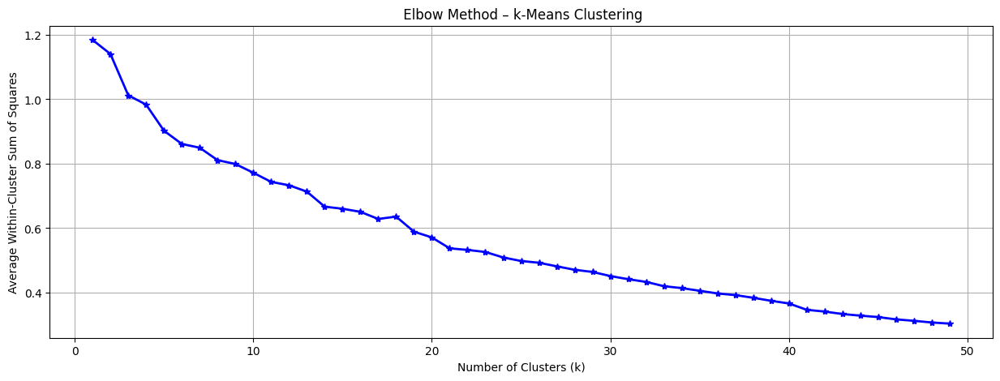

In [57]:

matrix, x_cols = matrix_from_df(data_train)
X = matrix[x_cols]

K = range(1, 50) 

# Fit KMeans for each k
KM = [KMeans(n_clusters=k, init='k-means++', random_state=42).fit(X) for k in K]

centroids = [km.cluster_centers_ for km in KM]

D_k = [cdist(X, cent, metric='euclidean') for cent in centroids]

dist = [np.min(D, axis=1) for D in D_k]

avgWithinSS = [np.mean(d) for d in dist]

# Plot the elbow curve
# plt.figure(figsize=(10, 6))
plt.plot(K, avgWithinSS, 'b*-', linewidth=2)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Within-Cluster Sum of Squares')
plt.title(' Elbow Method – k-Means Clustering')
plt.grid(True)
plt.show()


### Summary

- We computed k-means models from k=1 to k=49.
- For each `k`, we calculated the **average distance** of each point to its nearest centroid (WCSS).
- Plotted these values to form the **Elbow curve**.
- The **"elbow point"** is the value of `k` where adding more clusters yields **diminishing returns** in reducing WCSS.
- This is a **visual heuristic** for optimal `k`.

### Listing 4-9 – Elbow Method with Variance Explained

#### Goal:
Instead of using average within-cluster distances, we now evaluate the **percentage of total variance explained** for each value of `k` using:

- TSS (Total Sum of Squares): Total variation in the dataset
- WCSS (Within-Cluster Sum of Squares): Variation within clusters
- BSS = TSS - WCSS (Between-cluster SS)
- Variance Explained = BSS / TSS

A higher % of variance explained indicates that the clustering has better captured the structure of the data.


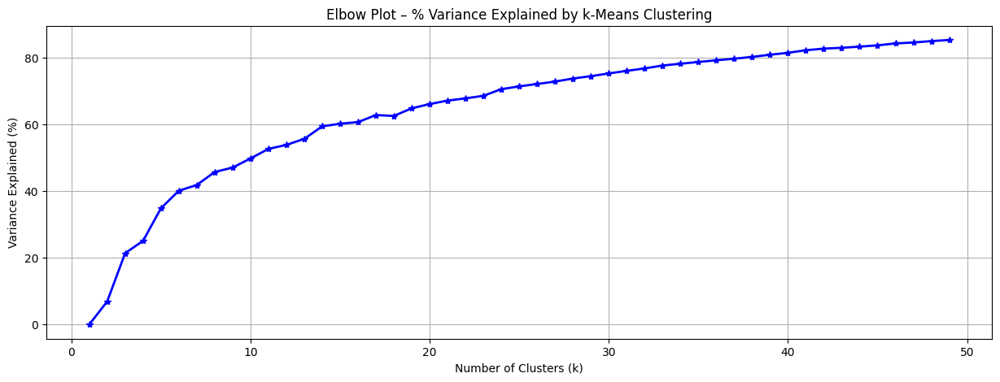

In [58]:

matrix, x_cols = matrix_from_df(data_train)
X = matrix[x_cols]

K = range(1, 50)

KM = [KMeans(n_clusters=k, init='k-means++', random_state=42).fit(X) for k in K]
centroids = [k.cluster_centers_ for k in KM]

D_k = [cdist(X, cent, metric='euclidean') for cent in centroids]
dist = [np.min(D, axis=1) for D in D_k]

# Compute WCSS for each k
wcss= [np.sum(d**2) for d in dist]

# Total sum of squares (TSS)
tss = np.sum(pdist(X)**2) / X.shape[0]

# Between-cluster SS
bss = [tss - w for w in wcss]

# Plot percentage of variance explained
# plt.figure(figsize=(10, 6))
plt.plot(K, np.array(bss)/tss * 100, 'b*-', linewidth=2)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Variance Explained (%)')
plt.title('Elbow Plot – % Variance Explained by k-Means Clustering')
plt.grid(True)
plt.show()


Optimal number of clusters (k) found: 5


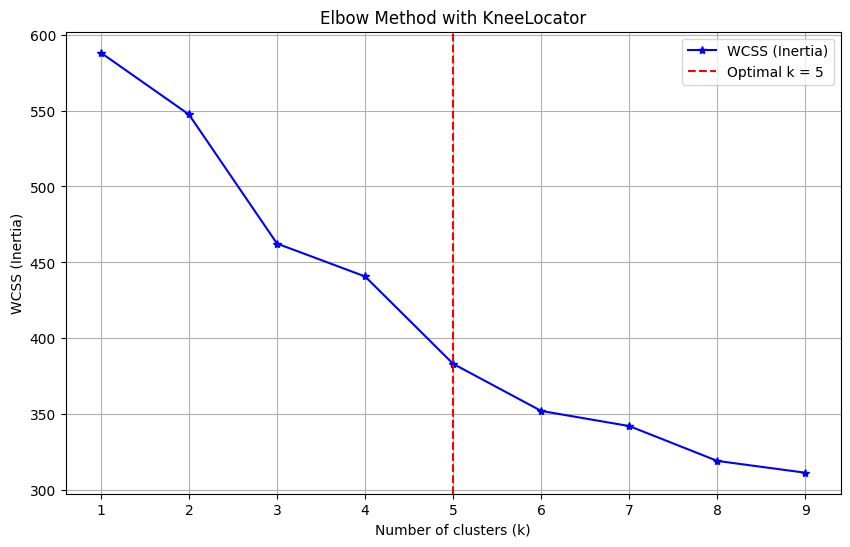

In [95]:
from kneed import KneeLocator

K = range(1, 10)
wcss = []

for k in K:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)  # inertia_ is the within-cluster sum of squares

# Automatically find the elbow using KneeLocator
knee = KneeLocator(K, wcss, curve='convex', direction='decreasing')

print(f"Optimal number of clusters (k) found: {knee.knee}")

plt.figure(figsize=(10, 6))
plt.plot(K, wcss, 'b*-', label='WCSS (Inertia)')
plt.axvline(x=knee.knee, color='red', linestyle='--', label=f'Optimal k = {knee.knee}')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS (Inertia)')
plt.title('Elbow Method with KneeLocator')
plt.legend()
plt.grid(True)
plt.show()

#### Interpretation 
- The plot of **variance explained (%)** vs. **number of clusters (k)** resembled an **exponential cumulative distribution function (CDF)**.
- It increased smoothly with each additional cluster — **no obvious elbow**.
- After observing carefully, Ross noticed a **flattening gradient** around **k = 9**, consistent with earlier Elbow method observations.


#### Challenge:
The smooth increase made it difficult to **visually identify a strong "elbow" point** from the variance curve.


### Listing 4-10 – Silhouette Score Plot for Clustering Evaluation

####  Goal:
Use the **Silhouette Score** to assess the quality of clusters formed by k-means for different values of `k` (from 2 to 29).

#### What is the Silhouette Score?
- A measure of **how similar a data point is to its own cluster** compared to other clusters.
- Value ranges from **-1 to 1**:
  - `+1`: Sample is well-matched to its own cluster and poorly matched to others
  - `0`: Sample is on the boundary of two clusters
  - `-1`: Sample is likely misclassified
- A **higher average silhouette score**


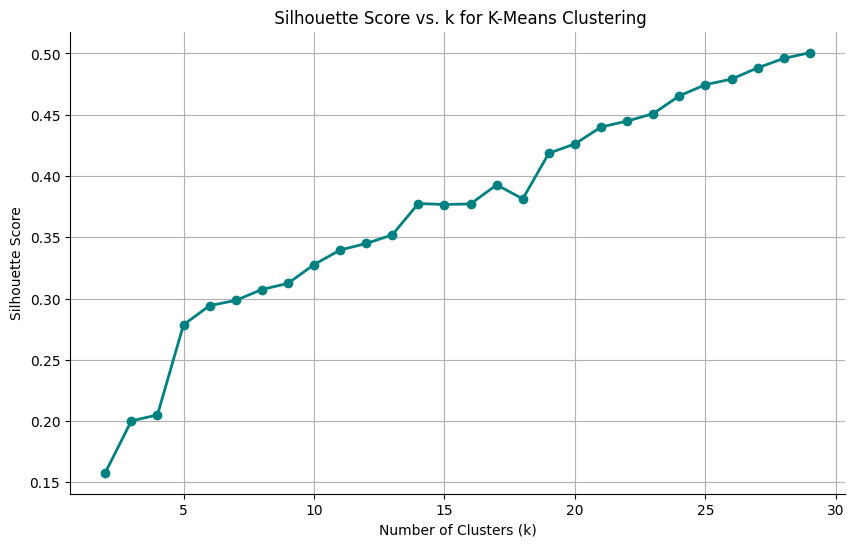

In [59]:
from sklearn.metrics import silhouette_score

silhouette_scores = []

for n_clusters in range(2, 30):
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
    kmeans.fit(X)
    labels = kmeans.labels_
    
    score = silhouette_score(X, labels, metric='euclidean')
    silhouette_scores.append(score)

# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 30), silhouette_scores, marker='o', color='teal', linewidth=2)
plt.ylabel("Silhouette Score")
plt.xlabel("Number of Clusters (k)")
plt.title(" Silhouette Score vs. k for K-Means Clustering")
sns.despine()
plt.grid(True)
plt.show()

Observation
Ross applied the Silhouette Method and found that:

The score kept increasing, peaking at k = 29
But choosing 27 clusters wasn't practical:
🚫 Too many segments for a dataset of only 398 papers
🚫 Unrealistic to market 29 clusters in a short timeframe

### Listing 4-11 – Training Final k-Means Model with k = 9

#### Goal:
Use the previously selected optimal number of clusters (**k = 9**) to:
1. Train the k-means model
2. Assign cluster labels to each paper
3. Inspect the number of papers assigned to each cluster

This prepares the dataset for interpretation, visualization, and further modeling (e.g., GMM).


### Listing 4-11 – Training Final k-Means Model with k = 9

####  Goal:
Use the previously selected optimal number of clusters (**k = 9**) to:
1. Train the k-means model
2. Assign cluster labels to each paper
3. Inspect the number of papers assigned to each cluster

This prepares the dataset for interpretation, visualization, and further modeling (e.g., GMM).


In [98]:

# Train k-means with k=9
cluster = KMeans(n_clusters=8, init='k-means++', random_state=2)
matrix['cluster'] = cluster.fit_predict(X)

# Display number of papers in each cluster
matrix['cluster'].value_counts().sort_index()

cluster
0     43
1     17
2     32
3    144
4     38
5     45
6     32
7     45
Name: count, dtype: int64

#### Summary

- Final **k-means model with k = 9** was trained using the group feature matrix.
- Each paper was assigned to one of the 9 clusters using `.fit_predict()`.
- The resulting `matrix` now contains a new column: `'cluster'`, denoting the cluster index for each paper.
- The distribution of papers across clusters gives insight into **cluster sizes and balance**.

You can visualize this distribution using a bar plot or use `matrix.groupby('cluster').size().plot(kind='bar')`.


In [99]:
matrix['cluster'].value_counts().mean()

np.float64(49.5)

### Listing 4-12 – Reducing Group Features into 2D PCA Components

#### Goal:
Apply **Principal Component Analysis (PCA)** to reduce the group-feature space to two components (`x`, `y`) and store them in a new DataFrame along with:
- `title` of the paper
- `cluster` assignment from k-means
- PCA-reduced coordinates for plotting or export

This structure helps with visualization and interpretation of cluster locations in 2D.


In [100]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(matrix[x_cols])

matrix['x'] = X_pca[:, 0]
matrix['y'] = X_pca[:, 1]

matrix = matrix.reset_index(drop=True)
customer_clusters = matrix[['title', 'cluster', 'x', 'y']]

# Preview the new 2D cluster summary
customer_clusters.head()


groups,title,cluster,x,y
0,"""Source Free"" Transfer Learning for Text Class...",0,0.615810,-0.060295
1,A Characterization of the Single-Peaked Single...,2,-0.756838,0.971322
2,"A Computational Method for (MSS,CoMSS) Partiti...",7,-0.287956,-0.216148
3,A Control Dichotomy for Pure Scoring Rules,6,-0.521295,0.570206
4,A Convex Formulation for Semi-supervised Multi...,5,0.198578,-0.129668


### Summary

- PCA was used to reduce dimensionality of the group-feature matrix (`X`) into two components: `x` and `y`.
- These were added to the main matrix and then extracted into a new DataFrame: `customer_clusters`.
- This summary table includes:
  - Research paper title
  - Assigned cluster (from k-means)
  - 2D PCA coordinates

This compact structure is ideal for:
- Visual analysis of clusters
- Tooltips in interactive plots (e.g., plotly, seaborn)
- Exporting results to CSV for sharing or reporting

### Listing 4-13 – Visualizing Clusters in 2D Space with Cluster Centers

#### Goal:
Plot the PCA-transformed research papers and color them based on their cluster membership.

Also overlay the **cluster centers** (centroids) after transforming them with PCA.

This provides a visual intuition of:
- How compact and well-separated clusters are
- Where each cluster's "center of mass" lies


/Users/apple/Documents/laiba/Apps/Jupyter-venv/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/var/folders/97/ldk24swd38n_sc034kw8dsm00000gn/T/ipykernel_7852/776817507.py:9: UserWarning: The palette list has more values (9) than needed (8), which may not be intended.
  sns.scatterplot(


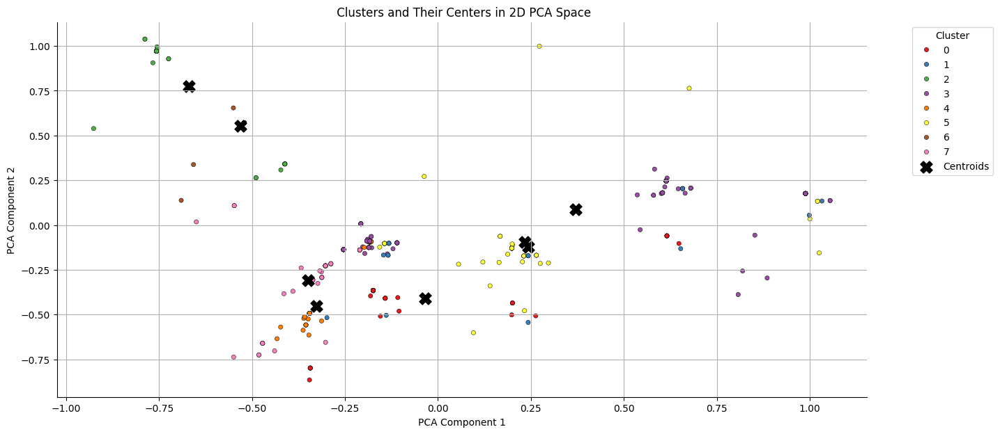

In [101]:

cluster_centers = pca.transform(cluster.cluster_centers_)

cluster_centers = pd.DataFrame(cluster_centers, columns=['x', 'y'])
cluster_centers['cluster'] = range(len(cluster_centers))

plt.figure(figsize=(15, 7))
palette = sns.color_palette("Set1", n_colors=9)

sns.scatterplot(
    data=customer_clusters,
    x='x', y='y',
    hue='cluster',
    palette=palette,
    legend='full',
    s=20,
    edgecolor='black'
)

# Overlay cluster centers
plt.scatter(
    cluster_centers['x'], cluster_centers['y'],
    s=150, c='black', marker='X', label='Centroids'
)

plt.title(" Clusters and Their Centers in 2D PCA Space")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
sns.despine()
plt.show()


### Summary

- The PCA-based 2D scatterplot shows each research paper as a point, colored by its **k-means cluster** (from `k=9`).
- Large black X-marks (`marker='X'`) denote **cluster centroids** in the PCA-reduced space.
- The clusters appear **well-separated**, which suggests meaningful grouping.

    Ross’s Objective Revisited:
- Now that we have visual clusters, we can begin **interpreting** them:
  - What types of papers are in each cluster?
  - What are the **dominant keywords** in each?

### Listing 4-14 – Merging Clustered Data Back with Original Dataset

#### Goal:
Merge the dimensionally-reduced cluster data (`customer_clusters`) with the original metadata (`data_train`) using the `title` column as the key.

This will give us a complete dataset containing:
- Original features: `title`, `keywords`, `topics`, `groups`
- Engineered features: `cluster`, `x`, `y` (PCA coordinates)

This enables us to:
- Analyze keywords/topics within each cluster
- Generate **word clouds** to visualize the dominant terms per segment


In [102]:

customer_clusters.columns.name = None

# Merge based on title
df = data_train.merge(customer_clusters, on='title')
df.head()


,title,groups,keywords,topics,flags,cluster,x,y
0,Kernelized Bayesian Transfer Learning,Novel Machine Learning Algorithms (NMLA),cross-domain learning\ndomain adaptation\nkern...,APP: Biomedical / Bioinformatics\nNMLA: Bayesi...,1,3,0.613870,0.245408
1,"""Source Free"" Transfer Learning for Text Class...",AI and the Web (AIW),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1,0,0.615810,-0.060295
2,"""Source Free"" Transfer Learning for Text Class...",Novel Machine Learning Algorithms (NMLA),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1,0,0.615810,-0.060295
3,A Generalization of Probabilistic Serial to Ra...,Game Theory and Economic Paradigms (GTEP),social choice theory\nvoting\nfair division\ns...,GTEP: Game Theory\nGTEP: Social Choice / Voting,1,6,-0.521295,0.570206
4,Lifetime Lexical Variation in Social Media,NLP and Text Mining (NLPTM),Generative model\nSocial Networks\nAge Prediction,AIW: Web personalization and user modeling\nNL...,1,3,-0.183192,-0.090091


### Summary

This is the final dataset used to:
- **Interpret clusters**
- **Visualize keyword/topic distributions**
- **Generate Word Clouds** for each segment to uncover key terms

🧠 Ross’s plan:
Use a **pivotal feature** (like `keywords`, `topics`, or `groups`) to generate word clouds for each `cluster`. Word size = frequency in the cluster.


### Listing 4-15 – Defining a Function to Generate Word Clouds

#### Goal:
Create a reusable function `wordcloud_object()` to generate a WordCloud object for any given list of words.

The function:
- Joins all words into a single string
- Removes common stopwords
- Uses a custom font (e.g., Arial from local `./fonts/` folder)
- Returns a WordCloud object ready for plotting


In [103]:
from wordcloud import WordCloud, STOPWORDS

def wordcloud_object(word_string):
    wordcloud = WordCloud(
        stopwords=STOPWORDS,
        background_color='black',
        width=1200,
        height=1000
    ).generate(' '.join(word_string))
    
    return wordcloud

### Summary

- The `wordcloud_object()` function accepts a **list of words** and returns a formatted **WordCloud object**.
- It uses:
  - `STOPWORDS` to remove common filler words
  - `font_path` to apply a consistent font (Arial)
  - `black` background for strong visual contrast

**Important**:
- Create a folder called `fonts` in your working directory
- Place `arial.ttf` (TrueType font) inside it — or use any other `.ttf` font you prefer
  - You can also use a system font by skipping `font_path` entirely for fallback


### Listing 4-16 – Generate Word Clouds for Each Cluster

####  Goal:
Create a function `plot_wordcloud()` that:
- Loops over each cluster (from 0 to `n_clusters - 1`)
- Aggregates all values from the **pivot feature** (e.g., 'keywords') in that cluster
- Cleans and splits them into individual words
- Generates and plots a WordCloud for that cluster

The `pivot` parameter can be:
- 'keywords'
- 'topics'
- 'groups'

📌 This enables you to visualize **dominant terms** associated with each cluster.


In [104]:
def plot_wordcloud(df, clusters, pivot):
    fig = plt.figure(figsize=(15, 30))  # Adjust height if needed
    
    for cluster in range(clusters):
        word_list = []

        # Extract and split pivot field for current cluster
        for val in df[df['cluster'] == cluster][pivot]:
            try:
                word_list.extend(val.split('\n'))
            except:
                pass  # Skip non-string values silently

        # Only plot if there are valid words
        if word_list:
            ax = fig.add_subplot(5, 2, cluster + 1)
            wordcloud = wordcloud_object(word_list)
            ax.imshow(wordcloud, interpolation='bilinear')
            ax.set_title(f"Cluster {cluster}", fontsize=14)
            ax.axis('off')

    plt.tight_layout()
    plt.show()


##  Listing 4-17 – Generate Word Clouds from 'keywords'

### Goal:
Use the function `plot_wordcloud()` to generate one word cloud per cluster using the `'keywords'` feature as the source of text.

This visually summarizes what themes or terms are most common in each cluster.


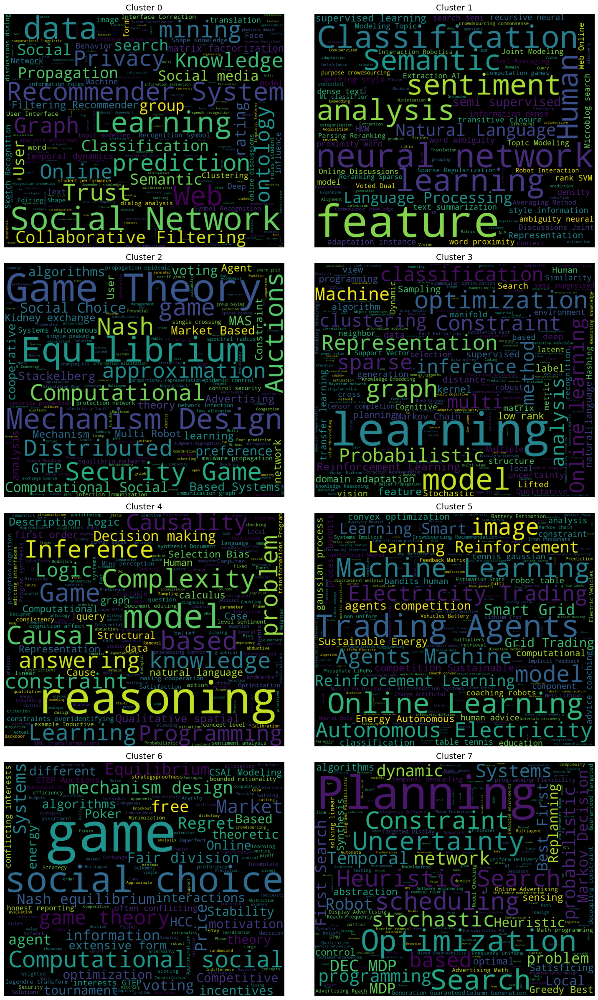

In [105]:
# Generate word clouds using 'keywords' as the pivot field
plot_wordcloud(df, cluster.n_clusters, 'keywords')

### Listing 4-18 – Find Complete Keywords for Given Term in Each Cluster

####  Goal:
Create a function `perform_cluster_group_audit()` to:
- Iterate over all or selected clusters
- Filter and print keywords that contain a specified **unigram or substring**
- Show frequency counts of those matching keywords

This helps with **auditing term pre**


In [68]:
from collections import Counter

def perform_cluster_group_audit(clusters, term):
    """
    Audits keywords in selected clusters, returning phrases that contain the search term.
    
    Parameters:
        clusters (list of int): List of cluster numbers
        term (str): The substring (unigram) to match inside each keyword
    """
    for cluster in clusters:
        df_cluster = df[df['cluster'] == cluster]
        print(f"\n📊 Cluster number: {cluster}")

        keywords_raw = df_cluster['keywords'].dropna().tolist()
        
        # Flatten the list of keyword strings, split on '\n'
        keywords = []
        for item in keywords_raw:
            try:
                keywords.extend([kw.strip().lower() for kw in item.split('\n')])
            except:
                continue
        
        # Keep only keywords that contain the target term
        matched_keywords = [kw for kw in keywords if term.lower() in kw]

        # Count frequencies
        keyword_counts = Counter(matched_keywords)

        if keyword_counts:
            for kw, count in keyword_counts.most_common():
                print(f" {kw} : {count}")
        else:
            print("No matches found.")


In [69]:
perform_cluster_group_audit([1, 5], 'search')


📊 Cluster number: 1
No matches found.

📊 Cluster number: 5
 similarity search : 2
 sponsored search : 1


In [70]:
perform_cluster_group_audit([3,4,7], 'social')


📊 Cluster number: 3
 social conformity : 2
 social networks : 1

📊 Cluster number: 4
 computational social choice : 2

📊 Cluster number: 7
 social planning : 2


In [71]:
perform_cluster_group_audit([0, 1, 2, 3, 4, 5, 6, 7, 8], 'learning')


📊 Cluster number: 0
 feature learning : 3
 transfer learning : 2
 online learning : 2
 multi-task learning : 2
 deep learning : 2
 cross-view learning : 1

📊 Cluster number: 1
 semi-supervised learning : 2
 structure learning : 2
 deep learning : 1

📊 Cluster number: 2
 multiagent learning : 2
 reinforcement learning : 2

📊 Cluster number: 3
 reinforcement learning : 9
 transfer learning : 7
 machine learning : 4
 structure learning : 4
 statistical relational learning : 4
 online learning : 4
 representation learning : 3
 manifold learning : 3
 multi-task learning : 3
 subjective experience-based learning : 3
 one-shot learning : 3
 semi-supervised learning : 2
 active learning : 2
 metric learning : 2
 online machine learning : 2
 supervised learning : 2
 stochastic learning : 2
 learning from feedback : 2
 canine learning : 2
 ensemble learning : 2
 cross-domain learning : 1
 weakly-supervised learning : 1
 inverse reinforcement learning : 1
 semi-supervised kernel learning : 1
 mu

### Summary

- This function searches for full keyword phrases that include a **target term** (e.g., "learning").
- Works **cluster-by-cluster**, showing keyword variations and frequencies.
- Helps with naming, interpreting, and comparing clusters based on content.

>  run this for any specific term like `graph`, `planning`, `social`, `network`,etc

## Exercise 1 – Generate Word Clouds by "groups"

###  Goal:
Visualize dominant "groups" associated with each cluster using word clouds.  
This reveals which high-level research areas (e.g., 'Vision', 'Learning', etc.) are dominant in each segment.


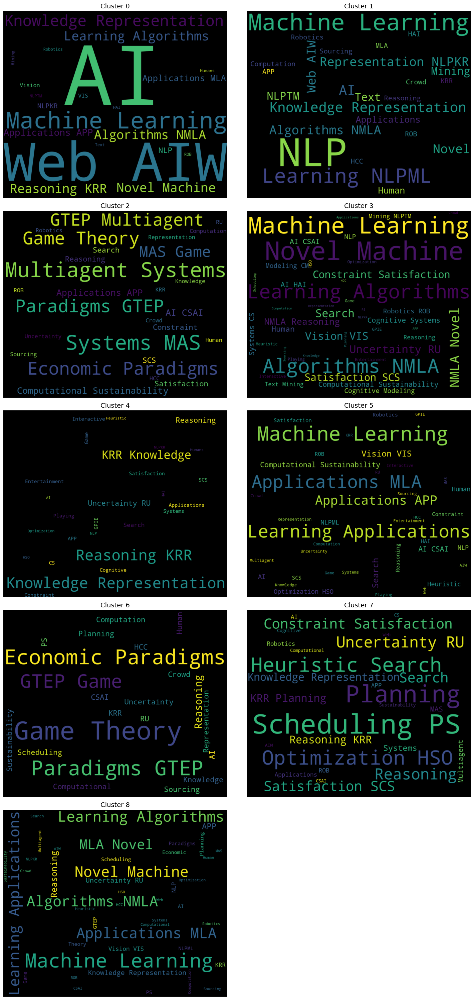

In [72]:
plot_wordcloud(df, cluster.n_clusters, 'groups')

## Exercise 2 – Generate Word Clouds by "topics"

### Goal:
Visualize the dominant "topics" for each cluster using word clouds.  
This uncovers fine-grained research subareas represented in each segment.


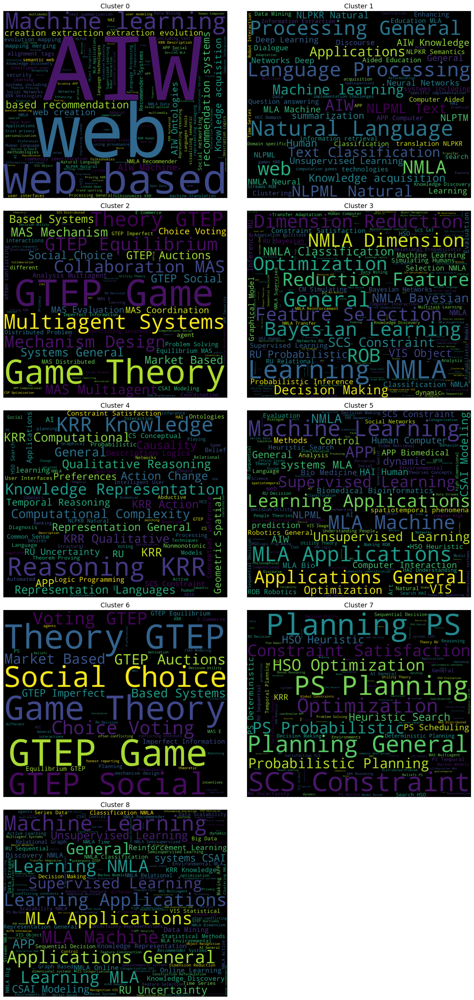

In [73]:
plot_wordcloud(df, cluster.n_clusters, 'topics')

### Summary of Word Cloud Analysis

- We visualized clusters based on 3 different metadata features:
  - `keywords` (Listing 4-17)
  - `groups` (Exercise 1)
  - `topics` (Exercise 2)

- These word clouds help us:
  - Understand what each cluster *means*
  - Identify which research areas are grouped together
  - Map clusters to real-world themes for marketing, summarization, or classification

 This completes the visual exploration of semantic clusters in the AAAI-14 dataset.


## Moving Beyond k-Means: Enter Gaussian Mixture Models (GMM)

### Motivation:
While k-means is fast and easy to interpret, it has an important limitation:
> It assumes clusters are **spherical**, equally sized, and linearly separable.

Ross wondered:
> "What if the clusters are **elongated**, **unevenly spread**, or even **overlapping**?"

This led him to discover **Gaussian Mixture Models (GMM)** — a more flexible alternative.

---

##  What is a Gaussian Mixture Model (GMM)?

###  Definition:
A **Gaussian Mixture Model** assumes that:
> All data points are generated from a **mixture of multiple Gaussian distributions**, each representing a cluster.

Each cluster is modeled as a **multivariate normal distribution**, defined by:
- A **mean vector** (cluster center)
- A **covariance matrix** (shape and orientation)

### Key Features:
- Assigns a **probability** to each point for belonging to each cluster.
- Allows **overlapping**, **elliptical**, or **uneven** clusters.
- Uses **Expectation-Maximization (EM)** to estimate parameters.

> Think of GMM as a **soft version of k-means**, where instead of hard assigning a point to a cluster, we get a **probability distribution** over clusters.

---

## Covariance Types in GMM

The shape of each cluster is controlled by how you let the covariance matrix behave. GMM supports the following options:

| Covariance Type | Description |
|------------------|-------------|
| **Spherical**     | All clusters are spheres (like k-means); same variance in all directions. |
| **Diagonal**      | Ellipses aligned with axes (different spread per dimension, no rotation). |
| **Tied**          | All clusters share the **same** covariance matrix. |
| **Full**          | Each cluster has its **own** full covariance matrix (most flexible). |

> **Full covariance** is most powerful, but also most computationally expensive.

---

##  GMM vs k-Means

| Feature                     | k-Means                  | GMM (Gaussian Mixture Model)         |
|-----------------------------|---------------------------|---------------------------------------|
| Cluster Shape               | Spherical                 | Elliptical or general (via covariance) |
| Assignment                  | Hard (1 cluster only)     | Soft (probability per cluster)         |
| Optimization Target         | Minimize distance         | Maximize likelihood                   |
| Interpretability            | Easier                    | Requires understanding of distributions |
| Use Cases                   | Fast segmentation         | Advanced, flexible clustering          |

---

## Why Ross Chose GMM

- To handle **non-spherical clusters**.
- To understand overlapping and fuzzy memberships.
- To compare GMM results with his earlier **k-means clusters**.

Next, Ross will define a function (Listing 4-21) to **visualize clusters generated from GMM** on a PCA-reduced 2D plot.


### Listing 4-21 – Define Function to Visualize GMM Clusters with Ellipses

#### Goal:
Define a plotting function `plot_results()` to:
- Display clusters from Gaussian Mixture Models in 2D PCA space
- Use **color-coded scatterplots** to distinguish clusters
- Overlay **elliptical contours** representing the covariance of each Gaussian component

This gives a more realistic view of non-spherical clusters compared to k-means.


In [74]:
import itertools
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

def plot_results(X, Y_, means, covariances, index, title):
    """
    Visualizes GMM clusters with elliptical covariance boundaries.

    Parameters:
    X            -- PCA-reduced 2D data
    Y_           -- Cluster assignments (labels)
    means        -- Centroids of GMM clusters
    covariances  -- Covariance matrices of each cluster
    index        -- Plot index in subplot grid
    title        -- Plot title
    """
    color_iter = itertools.cycle([
        'b', 'g', 'red', 'm', 'y', 'navy', 'c',
        'cornflowerblue', 'gold', 'darkorange'
    ])

    # Create subplot
    fig, ax = plt.subplots(figsize=(8, 6))
    for i, (mean, covar, color) in enumerate(zip(means, covariances, color_iter)):
        if not np.any(Y_ == i):
            continue

        # Scatter cluster points
        ax.scatter(X[Y_ == i, 0], X[Y_ == i, 1], s=20, color=color, label=f'Cluster {i}')

        # Draw covariance ellipse
        v, w = np.linalg.eigh(covar)
        v = 2. * np.sqrt(2.) * np.sqrt(v)  # scale for plotting
        u = w[0] / np.linalg.norm(w[0])
        angle = np.arctan2(u[1], u[0]) * (180. / np.pi)  # radians → degrees

        ell = mpl.patches.Ellipse(
            (mean[0], mean[1]),
            width=v[0],
            height=v[1],
            angle=180. + angle,
            color=color,
            alpha=0.5
        )
        ax.add_patch(ell)

    ax.set_title(title, fontsize=14)
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Summary

- The `plot_results()` function is designed for **GMM cluster visualization**.
- Each cluster is shown with:
  - A distinct **color-coded scatter plot**
  - A semi-transparent **ellipse** that captures the **spread and orientation** of that cluster based on its covariance matrix
- This is more powerful than k-means' circular clusters and gives a **true shape** of the data's latent Gaussian structure.

    Benefits of this method:
- Highlights **overlapping clusters**
- Reveals **elliptical or rotated** data distributions
- Shows how well-separated or fuzzy clusters are


### Listing 4-22 – Finding the Best GMM using BIC Across Covariance Types

#### Goal:
Evaluate Gaussian Mixture Models across combinations of:
- Covariance types: `'spherical'`, `'tied'`, `'full'`
- Number of components (clusters): 2 to 9

We:
1. Fit GMMs to the feature matrix
2. Compute **BIC (Bayesian Information Criterion)** for each
3. Select the **best model** (lowest BIC)
4. Plot all BIC scores for comparison
5. Visualize the selected model using `plot_results()`


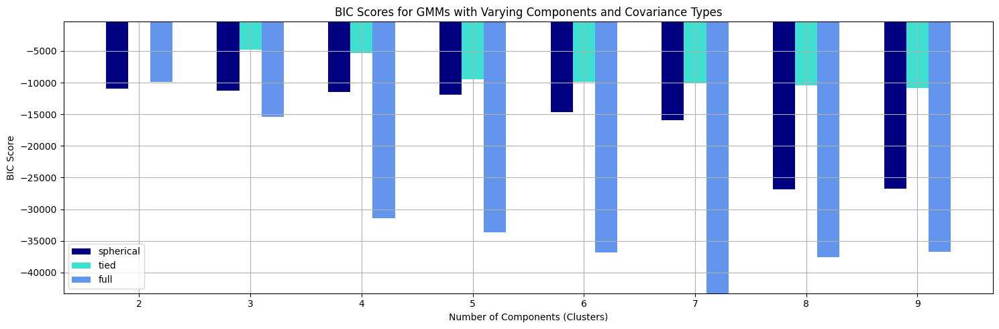

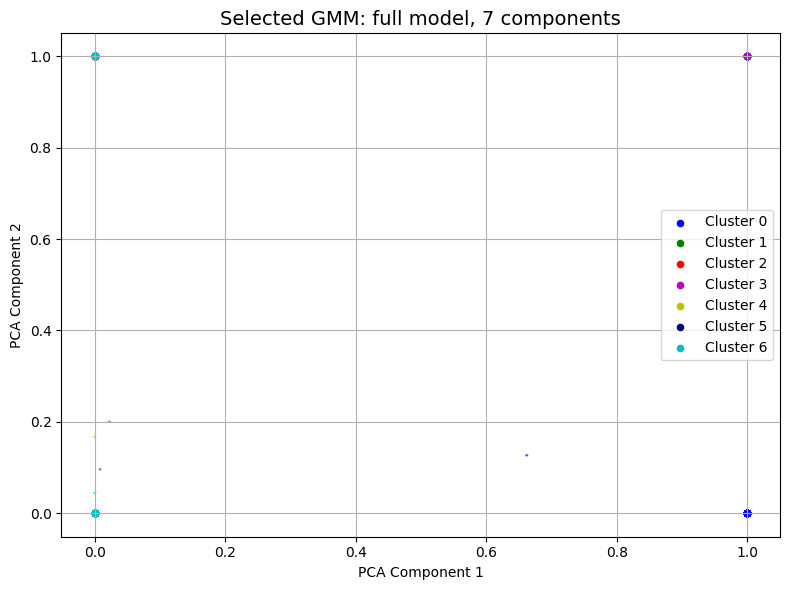

In [75]:
from sklearn import mixture

# Prepare feature matrix again
matrix, x_cols = matrix_from_df(data_train)
X = matrix[x_cols].values  # use .values instead of deprecated .as_matrix()

model_stats = []
n_components_range = range(2, 10)
cv_types = ['spherical', 'tied', 'full']

# Fit GMMs with all combinations of components and covariance types
for cv_type in cv_types:
    for n_components in n_components_range:
        gmm = mixture.GaussianMixture(
            n_components=n_components,
            covariance_type=cv_type,
            random_state=0
        )
        gmm.fit(X)
        model_stats.append({
            'name': f'{cv_type}_{n_components}',
            'model': gmm,
            'bic': gmm.bic(X)
        })

# Extract BIC values and find best model
bic = np.array([m['bic'] for m in model_stats])
best_gmm = model_stats[bic.argmin()]  # minimum BIC is best
clf = best_gmm['model']

# Plot BIC Scores
# plt.figure(figsize=(10, 6))
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue'])
bars = []

for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 1)
    bic_scores = bic[i * len(n_components_range):(i + 1) * len(n_components_range)]
    bars.append(plt.bar(xpos, bic_scores, width=0.2, color=color))

plt.xticks(n_components_range)
plt.ylim([bic.min() * 0.99, bic.max() * 1.01])
plt.title('BIC Scores for GMMs with Varying Components and Covariance Types')
plt.xlabel('Number of Components (Clusters)')
plt.ylabel('BIC Score')
plt.legend([b[0] for b in bars], cv_types)
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualize Best GMM
labels = clf.predict(X)
plot_results(
    X, labels,
    clf.means_,
    clf.covariances_,
    index=1,
    title=f'Selected GMM: {best_gmm["name"].split("_")[0]} model, '
          f'{best_gmm["name"].split("_")[1]} components'
)


#### Summary

- Ran GMMs for **3 covariance types** across **8 values of `k` (2–9)**.
- Used **BIC (Bayesian Information Criterion)** to evaluate model fit:
  - Lower BIC = Better balance of model complexity and likelihood
- Plotted BIC scores across models for **visual comparison**
- Selected best model with **lowest BIC**, then visualized its clustering in PCA space


### Listing 4-23 – Frequency of Records in Each GMM Cluster

#### Goal:
Assign the GMM cluster labels back to the matrix and view how many records fall into each cluster.
This helps assess:
- Cluster balance
- Potential outliers
- Dominant groupings


In [76]:
matrix['cluster'] = labels
matrix.cluster.value_counts().sort_index()


cluster
0     71
1    125
2     26
3     45
4     12
5     26
6     91
Name: count, dtype: int64

### Summary

- Each record (research paper) is now labeled with a GMM cluster.
- This provides a sense of **distribution across clusters**.
- You can also visualize this with a bar chart:
```python
matrix['cluster'].value_counts().sort_index().plot(kind='bar', title='Cluster Distribution')


<Axes: title={'center': 'Cluster Distribution'}, xlabel='cluster'>

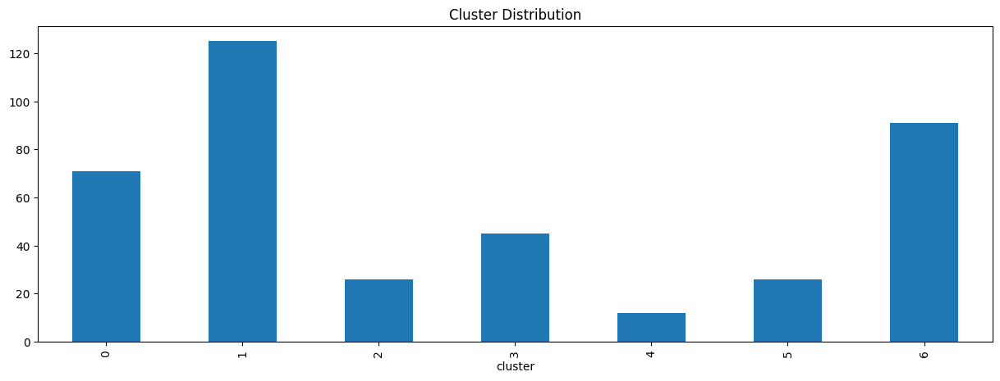

In [77]:
matrix['cluster'].value_counts().sort_index().plot(kind='bar', title='Cluster Distribution')

### Listing 4-24 – Merge Cluster Data Back with Original Metadata

### Goal:
Merge the cluster results (`matrix`) into the original metadata (`data_train`) using the `title` column.

This allows us to:
- Analyze topics, groups, and keywords per GMM cluster
- Generate word clouds
- Audit clusters qualitatively

In [78]:
customer_clusters = matrix[['title', 'cluster']]
customer_clusters.columns.name = None

df = data_train.merge(customer_clusters, on='title')

df.head()

,title,groups,keywords,topics,flags,cluster
0,Kernelized Bayesian Transfer Learning,Novel Machine Learning Algorithms (NMLA),cross-domain learning\ndomain adaptation\nkern...,APP: Biomedical / Bioinformatics\nNMLA: Bayesi...,1,1
1,"""Source Free"" Transfer Learning for Text Class...",AI and the Web (AIW),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1,0
2,"""Source Free"" Transfer Learning for Text Class...",Novel Machine Learning Algorithms (NMLA),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1,0
3,A Generalization of Probabilistic Serial to Ra...,Game Theory and Economic Paradigms (GTEP),social choice theory\nvoting\nfair division\ns...,GTEP: Game Theory\nGTEP: Social Choice / Voting,1,6
4,Lifetime Lexical Variation in Social Media,NLP and Text Mining (NLPTM),Generative model\nSocial Networks\nAge Prediction,AIW: Web personalization and user modeling\nNL...,1,0


### Summary

- Merged original paper metadata (`title`, `keywords`, `topics`, `groups`) with their **GMM-assigned clusters**.
- The resulting DataFrame (`df`) is ready for **semantic interpretation** through word clouds and audits.

Ready for next step: visualizing **dominant terms per cluster** using word clouds.

### Listing 4-25 – Generate Word Clouds for Each GMM Cluster using "keywords"

#### Goal:
Visualize the most frequent **keywords** in each GMM cluster using the previously defined `plot_wordcloud()` function.

Each cloud:
- Represents one cluster
- Uses font size to indicate term frequency

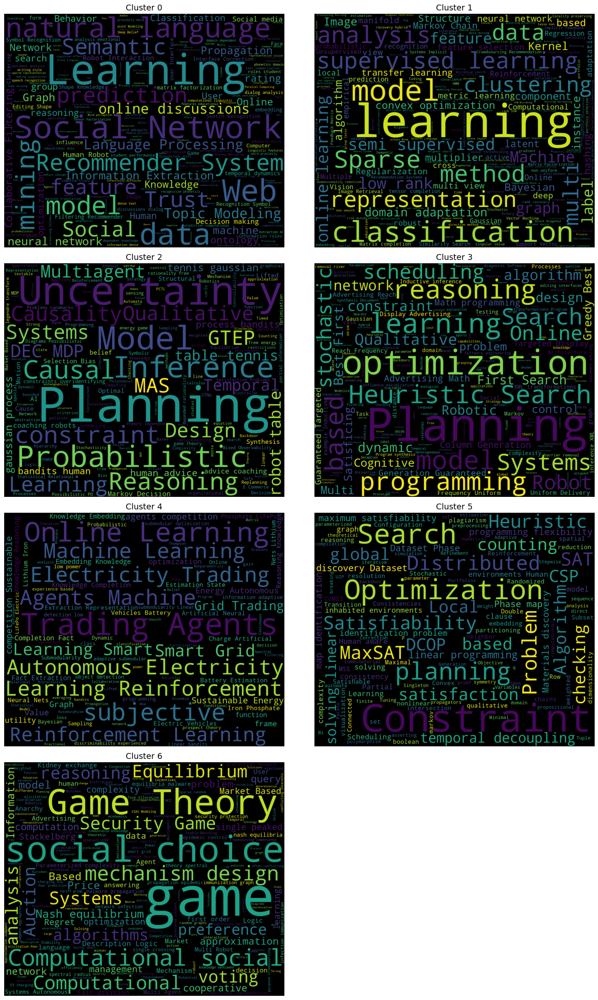

In [79]:
plot_wordcloud(df, gmm.n_components, 'keywords')

### Summary

- Word clouds help interpret the **semantic meaning** of each cluster.
- Using `"keywords"` provides a high-level view of what topics dominate each GMM-based segment.
- You can repeat the process using `"topics"` or `"groups"` to analyze from different perspectives.


## Bayesian Gaussian Mixture Model (BGMM)

### Goal:
Let the model **automatically determine the optimal number of clusters** instead of specifying `k` manually.

### Why BGMM?
- In **GMM**, you must **predefine** the number of components (`n_components`)
- In **BGMM**, you set a **higher upper bound** for components, and the model learns how many are needed
- The model achieves this by:
  - Shrinking unneeded cluster weights close to **zero**
  - Using **Dirichlet Process-like variational inference**

### Key Parameters:
- `n_components`: Maximum number of clusters the model is allowed to consider
- `weight_concentration_prior`:
  - Controls the **sparsity** of clusters
  - Lower values = model prefers **fewer active clusters**


### Listing 4-26 – Training and Visualizing Bayesian Gaussian Mixture Model

#### Goal:
Train a **Bayesian GMM** with a **Dirichlet Process Prior** to let the model decide the number of clusters.
- Set upper bound of `n_components=3`
- Visualize resulting clusters using `plot_results()` function
- Show whether the model **converged** successfully


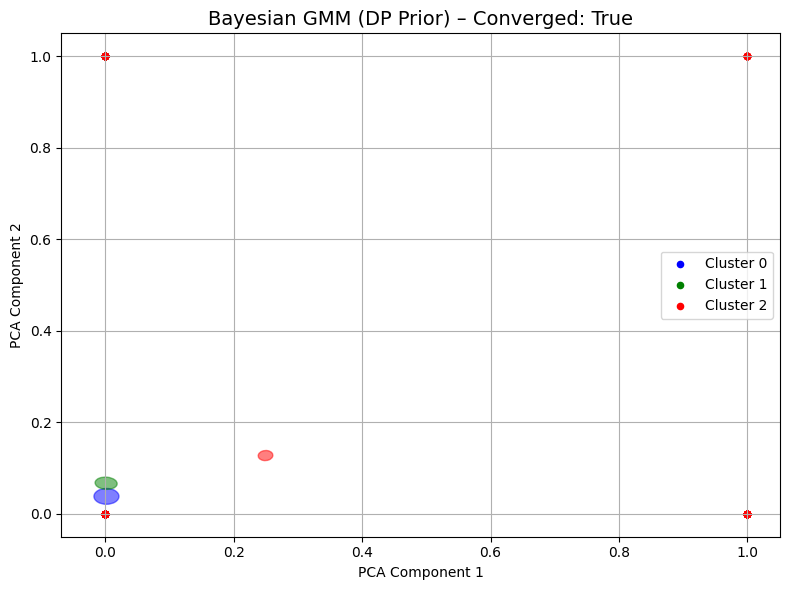

In [80]:
from sklearn.mixture import BayesianGaussianMixture

matrix, x_cols = matrix_from_df(data_train)
X = matrix[x_cols].values  

# Train BGMM (aka DPGMM)
dpgmm = BayesianGaussianMixture(
    n_components=3,
    covariance_type='full',
    weight_concentration_prior=1e-2,  # Optional: encourages sparsity
    random_state=1
).fit(X)

# Predict labels
labels = dpgmm.predict(X)

# Visualize clusters using the reusable function
plot_results(
    X, labels,
    dpgmm.means_,
    dpgmm.covariances_,
    index=1,
    title=f'Bayesian GMM (DP Prior) – Converged: {dpgmm.converged_}'
)

### Summary

- Trained a **Bayesian GMM** with `n_components=3` and `'full'` covariance
- Used **variational inference** to estimate component weights
- The model determines **effective cluster count** by shrinking unused weights
- The `plot_results()` function shows:
  - Data points by cluster
  - Cluster shapes as ellipses (from covariances)
  - Model convergence status (`converged=True` if successful)

**Tip**: You can print or plot the component weights to see if some are nearly zero:
```python
print(dpgmm.weights_)

In [81]:
print(dpgmm.weights_)

[0.20403459 0.30382    0.49214541]


### Listing 4-27 – Frequency of Records in Each Bayesian GMM Cluster

#### Goal:
Assign BGMM cluster labels to the feature matrix and view how many records fall into each cluster.
This gives us:
- Cluster size balance
- Understanding of dominant vs minor clusters


In [82]:
# Assign BGMM cluster labels
matrix['cluster'] = labels

# Count number of papers in each cluster
matrix['cluster'].value_counts().sort_index()


cluster
0     80
1    120
2    196
Name: count, dtype: int64

### Listing 4-28 – Merge Bayesian Clusters into Full Dataset

#### Goal:
Merge cluster assignments from BGMM back with the original paper metadata (`data_train`) using the common key (`title`) for interpretation.


In [83]:
# Prepare DataFrame with title and cluster only
customer_clusters = matrix[['title', 'cluster']]
customer_clusters.columns.name = None

# Merge with original metadata
df = data_train.merge(customer_clusters, on='title')

df.head()


,title,groups,keywords,topics,flags,cluster
0,Kernelized Bayesian Transfer Learning,Novel Machine Learning Algorithms (NMLA),cross-domain learning\ndomain adaptation\nkern...,APP: Biomedical / Bioinformatics\nNMLA: Bayesi...,1,2
1,"""Source Free"" Transfer Learning for Text Class...",AI and the Web (AIW),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1,2
2,"""Source Free"" Transfer Learning for Text Class...",Novel Machine Learning Algorithms (NMLA),Transfer Learning\nAuxiliary Data Retrieval\nT...,AIW: Knowledge acquisition from the web\nAIW: ...,1,2
3,A Generalization of Probabilistic Serial to Ra...,Game Theory and Economic Paradigms (GTEP),social choice theory\nvoting\nfair division\ns...,GTEP: Game Theory\nGTEP: Social Choice / Voting,1,1
4,Lifetime Lexical Variation in Social Media,NLP and Text Mining (NLPTM),Generative model\nSocial Networks\nAge Prediction,AIW: Web personalization and user modeling\nNL...,1,2


### Listing 4-29 – Generate Word Clouds by 'keywords' for Bayesian GMM Clusters

#### Goal:
Use word clouds to **visually interpret** what each cluster is about by plotting the `keywords` associated with each cluster.
This helps in naming the clusters meaningfully.


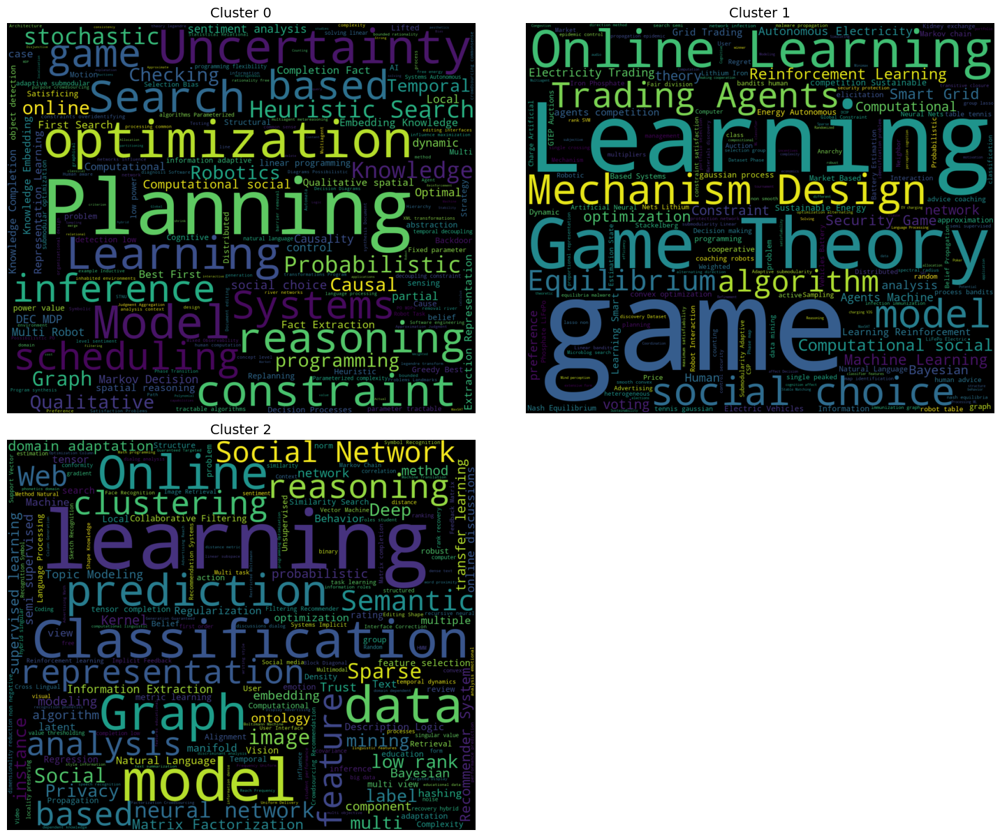

In [84]:
# Generate word clouds using the keywords field
plot_wordcloud(df, dpgmm.n_components, 'keywords')



### Cluster Interpretation Based on Word Clouds

Ross interpreted the clusters based on their dominant keywords:

- **Cluster 0**: Planning, Uncertainty, Constraint, Heuristic, Optimization, Inference, Model, Systems, Programming, Reasoning, Search, Robotics
- **Cluster 1**: Game, Equilibrium ,Theory, Mechanism Design ,Trading Agents, Preference ,Online Learning,Reinforcement, Optimization, Social Choice, Electricity, Security, Autonomous
- **Cluster 2**: Classification, model, learning, graphs, prediction, online, clustering, data, resoning, feature,based, social network



## Why Drop k-Means? Why Stick with Bayesian GMM?

Ross chose to move forward with Bayesian Gaussian Mixture Model clustering because:

1.  **Automatic Cluster Selection**:
   - No need to manually set `k`
   - Handles uncertainty via priors

2. **Interpretability**:
   - Word clouds showed that BGMM clusters were **more coherent** than k-means

3. **Flexibility**:
   - BGMM allowed **elliptical and overlapping** clusters
   - Could shrink unused components to zero

This made BGMM a **smart and adaptive clustering choice** for unsupervised NLP tasks.
